In [1]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import scanpy.external as sce
import time
import os

import numpy as np
from copy import deepcopy
from colors import rgb, hex

import scipy.cluster.hierarchy as hc

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
import matplotlib.colors as colors
import matplotlib.font_manager

import cmocean


In [2]:
#sc.settings.verbosity = 1             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, frameon=True, figsize=(3, 3), facecolor='white')

In [3]:
# SPECIFY SAVE DIRECTORIES
tag = 'LungCancer' # optional key word to append to directory name
now = time.strftime("%x") 
now = str.replace(now,'/','_')

# SPECIFY OUTPUT STEMS FOR FIGURES/PATHWAY ANALYSIS
#FIG_output_stem = "./output_step2.5.3.filter_junk_scanpy_pipeline/" + now +'/'
FIG_output_stem = "./output2_step2.5.3.filter_junk_scanpy_pipeline/" + 'figure' +'/'
DATA_output_stem = "./output2_step2.5.3.filter_junk_scanpy_pipeline/" + 'data' +'/'

print(FIG_output_stem)
print(DATA_output_stem)

# CREATE FIGURE DIRECTORY IF IT DOES NOT EXIST     
d = os.path.dirname(FIG_output_stem)
if not os.path.exists(d):
        os.makedirs(d)

d = os.path.dirname(DATA_output_stem)
if not os.path.exists(d):
        os.makedirs(d)

./output2_step2.5.3.filter_junk_scanpy_pipeline/figure/
./output2_step2.5.3.filter_junk_scanpy_pipeline/data/


In [4]:
sc.settings.figdir=FIG_output_stem

In [5]:
# --- DEFINE ALL COLORMAPS UPFRONT FOR UNIFORMITY ---

# CATEGORICAL: SAMPLE
FLATUI_SAMPLE = [ 
                 '800000', #'RU255B_BRAINMET_4S_TR' --> BRAIN MET (TR) FF4040 REDS
                 '551A8B', #'RU653_TUMOR_1AS_UTR' --> PRIMARY 551A8B purple
                 '0000EE', #'RU661_TUMOR_1AS_UTR' -- PRIMARY 0000EE blue
                 'FF00FF', #'RU666_SPINEMET_4NS_TR' --> SPINE MET (TR) 8B0000 REDS
                 'EEEE00', #'RU675_NORMAL_1ANS_UTR' --> NORMAL EEEE00 YELLOWS
                 '4682B4', #'RU675_TUMOR_1ANS_UTR' --> PRIMARY 4682B4 steel blue
                 '63B8FF', #'RU676_TUMOR_1AS_UTR' --> PRIMARY 63B8FF steel blue 1
                 '9400D3', #'RU679_TUMOR_2AS_TR' --> PRIMARY (TR) 9400D3 DARK VIOLET
                 '33A1C9', #'RU680_TUMOR_1AS_UTR' --> PRIMARY 33A1C9 peacock
                 'DC143C', #'RU681_BRAINMET_4S_TR' --> BRAIN MET (TR) CD0000 REDS
                 'CDCD00', #'RU682_NORMAL_2AS_UTR' --> NORMAL CDCD00 YELLOWS
                 '00C5CD', #'RU682_TUMOR_2AS_UTR' --> PRIMARY 00C5CD turquois
                 '8B8B00', #'RU684_NORMAL_1AS_UTR'--> NORMAL 8B8B00 YELLOWS
                 '03A89E', #'RU684_TUMOR_1AS_UTR' --> PRIMARY 03A89E maganese blue
                 '808069', #'RU685_NORMAL_1ANS_UTR' --> NORMAL 808069 YELLOWS
                 'FF1493', # RU699_ADRENAL_MET
                 'FF4500', #RU701_BRAINMET
]

# CATEGORICAL: NORMAL SAMPLES
FLATUI_NORMAL = [ 
                 
                 'EEEE00', #'RU675_NORMAL_1ANS_UTR' --> NORMAL EEEE00 YELLOWS
                 'CDCD00', #'RU682_NORMAL_2AS_UTR' --> NORMAL CDCD00 YELLOWS
                 '8B8B00', #'RU684_NORMAL_1AS_UTR'--> NORMAL 8B8B00 YELLOWS
                 '808069', #'RU685_NORMAL_1ANS_UTR' --> NORMAL 808069 YELLOWS
]

FLATUI_CANCERandNORMAL = [ 
                 '551A8B', #'RU653_TUMOR_1AS_UTR' --> PRIMARY 551A8B purple
                 '0000EE', #'RU661_TUMOR_1AS_UTR' -- PRIMARY 0000EE blue
                 'EEEE00', #'RU675_NORMAL_1ANS_UTR' --> NORMAL EEEE00 YELLOWS
                 '4682B4', #'RU675_TUMOR_1ANS_UTR' --> PRIMARY 4682B4 steel blue
                 '63B8FF', #'RU676_TUMOR_1AS_UTR' --> PRIMARY 63B8FF steel blue 1
                 '9400D3', #'RU679_TUMOR_2AS_TR' --> PRIMARY (TR) 9400D3 DARK VIOLET
                 '33A1C9', #'RU680_TUMOR_1AS_UTR' --> PRIMARY 33A1C9 peacockEDS
                 'CDCD00', #'RU682_NORMAL_2AS_UTR' --> NORMAL CDCD00 YELLOWS
                 '00C5CD', #'RU682_TUMOR_2AS_UTR' --> PRIMARY 00C5CD turquois
                 '8B8B00', #'RU684_NORMAL_1AS_UTR'--> NORMAL 8B8B00 YELLOWS
                 '03A89E', #'RU684_TUMOR_1AS_UTR' --> PRIMARY 03A89E maganese blue
                 '808069', #'RU685_NORMAL_1ANS_UTR' --> NORMAL 808069 YELLOWS
]

FLATUI_SOURCE = [

                 'FF0000', # MET
                 'E6E6FA', # NORMAL
                 '000000', # PRIMARY
]

FLATUI_PATIENT = [
                 'FF4040', # 255B
                 '551A8B', # 653
                 '0000EE', # 661
                 '8B0000', # 666
                 '4682B4', # 675
                 '63B8FF', # 676
                 'CD00CD', # 679
                 '9400D3', # 680
                 '33A1C9', # 681
                 'CD0000', # 682
                 '00C5CD', # 684
                 '03A89E', # 685
                 '808069', # 699
                 '99FFFF', # 701
]

FLATUI_CLASS = [
                 '0000FF', # 0
                 'FF0000', # 1   
                 'FF8C00', # 2
                 'FFD700', # 3  
                 '808000', # 4
                 '9ACD32', # 5   
                 '44F544', # 6
                 '20B2AA', # 7  
                 '2F4F4F', # 8
                 '00BFFF', # 9   
                 '147ADF', # 10
                 '191970', # 11 
                 '6200A4', # 12
                 '8B008B', # 13  
                 'FF00FF', # 14
                 'FF1493', # 15 
                 '8B4513', # 16
                 'D2691E', # 17 
                 'B0C4DE', # 18
                 '696969', # 19
                 'FF586E', # 20
                 'FAEBD7', # 21
                 'E2C792', # 22
                 'FFF7A4', # 23
                 '83715A', # 24
                 'BC8F8F', # 25
                 '4C718E', # 26
                 '519395', # 27
                 '7FFFD4', # 28  
                 '0F830F', # 29
                 'D4FFF0', # 30
                 'B72222', # 31
                 'FDBABA', # 32
                 '1B1010', # 33
                 'CD57FF', # 34
                 'F0FFFF', # 35
        
]

# UPDATE COLORMAP
FLATUI_CELL_TYPE = [
                 '014E4E', # Breg
                 '800080', # DENDRITIC
                 '490049', # DENDRITIC (ACTIVATED)
                 '0000FF', # ENDOTHELIAL
                 'BC8F8F', # EPITHELIAL
                 '00994C', # FIBROBLAST
                 '000000', # IG
                 '000080', # MACROPHAGE
                 'B0C4DE', # MAST
                 'FF00FF', # MDSC
                 '0080FF', # MICROGLIA/MACROPHAGE
                 'D8BFD8', # MONOCYTE
                 '983DFF', # MONOCYTE (ACTIVATED)
                 'FF0000', # NK
                 '800000', # NKT
                 '00CCCC', # PERICYTE
                 '00FF7F', # PROLIFERATING MESENCHYMAL PROGENITOR
                 'FFD700', # Th
                 '994C00', # Tm
                 'FF8000', # Treg
]



# METACELL TYPE TO HEX
FLATUI_METACELL = [
                   '00008B', # LYMPHOID
                   '8B008B', # MYELOID
                   'BC8F8F', # OTHER
                   ]

FLATUI_MYELOID_OTHER_ALL_PHENOGRAPH_CLASS = [
                 '0000FF', # 0
                 'FF0000', # 1   
                 'FF8C00', # 2
                 'FFD700', # 3  
                 '808000', # 4
                 '9ACD32', # 5   
                 '44F544', # 6
                 '20B2AA', # 7  
                 '2F4F4F', # 8
                 '00BFFF', # 9   
                 '147ADF', # 10
                 '191970', # 11 
                 '6200A4', # 12
                 '8B008B', # 13  
                 'FF00FF', # 14
                 'FF1493', # 15 
                 '8B4513', # 16
                 'B0C4DE', # 17
                 '606060', # 18 
                 '696969', # 19
                 'FF586E', # 20
                 'FAEBD7', # 21
                 'E2C792', # 22
                 'FFF7A4', # 23
                 '83715A', # 24
                 'BC8F8F', # 25
                 '4C718E', # 26
                 '519395', # 27
                 '7FFFD4', # 28  
                 '0F830F', # 29
                 'D4FFF0', # 30
                 'B72222', # 31
                 'FDBABA', # 32
                 '1B1010', # 33
                 'CD57FF', # 34
                 'CCFFFF', # 34 **
                 'CD853F', # 36
                 'FF7F50', # 37
                 'C692FF', #38
                 '433355', # 39
        
]

FLATUI_CELL_TYPE_MYELOID_OTHER_ALL = [
                 '800080', # DENDRITIC (purple)
                 '490049', # DENDRITIC ACTIVATED (purple)
                 '0000FF', # ENDOTHELIAL (RED)
                 'BC8F8F', # EPITHELIAL (tan)
                 '00994C', # FIBROBLAST (dark green
                 '000080', # MACROPHAGE (blue)
                 'B0C4DE', # MAST (purple/gray)
                 'FF00FF', # MDSC (light blue/grey)
                 '0080FF', # MICROGLIA/MACROPHAGE
                 'D8BFD8', # MONOCYTE (magenta))
                 '983DFF', # MONOCYTE ACTIVATED(magenta))
                 '00CCCC', # PERICYTE (bright blue)
                 '00FF7F', # PROLIFERATING MESENCHYMAL PROGENITOR (bright green)
]

FLATUI_LYMPHOID_ALL_PHENOGRAPH_CLASS = [
                 '0000FF', # 0
                 'FF0000', # 1   
                 'FFD700', # 2
                 '808000', # 3 
                 '006400', # 4
                 '20B2AA', # 5 
                 '00BFFF', # 6   
                 '1E90FF', # 7
                 '4B0082', # 8 
                 '8B008B', # 9 
                 'FF1493', # 10
                 'D2691E', # 11 
                 'B0C4DE', # 12 
                 'FAEBD7', # 14
                 'FFFACD', # 15
                 'D2B48C', # 16
                 '5F9EA0', # 18
                 '8FBC8F', # 19
                 '00FA9A', # 20
                 '66CDAA', # 21
                 '3CB371', # 22  
]

FLATUI_CELL_TYPE_LYMPHOID_ALL = ['014E4E', # Breg 
                                 '000000', # IG
                                 'FF0000', # NK
                                 '800000', # NKT
                                 'FFD700', # Th
                                 '994C00', # Tm
                                 'FF8000', # Treg
                                ]

# UPDATE COLOR MAP TO ASSOCIATE LINEAGE COLOR WITH EACH CLASS
FLATUI_CLASS_NORMAL_LINEAGES = [
                 'FF66FF', # AEC1, CLASS 2 
                 '6600CC', # AEC2, CLASS 0
                 '3399FF', # CILIATED, CLASS 1
                 'FF8800', # CLUB/CLARA, CLASS 3
]

FLATUI_PHENOGRAPH_CLASS_NORMAL = [
                 '6600CC', # AT2, CLASS 0
                 '3399FF', # CILIATED, CLASS 1
                 'FF66FF', # AT1, CLASS 2 
                 'FF8800', # CLUB/CLARA, CLASS 3
]

# DEFINE LINEAGE COLORMAP
FLATUI_LINEAGE = [
                 'FF66FF', # AEC1 pink
                 '6600CC', # AEC2 purple
                 '9ACD32', # AEP/MUCINOUS
                 '3399FF', # CILIATED skye blue
                 'FF8800', # CLUB orange
                 '0000FF', # KRT5+BASAL (MESENCHYMAL/KRAS HIGH),#'0000FF' dark blue
                 'FFD700', # PNEC
                 'E6E6FA', # STEM/PROGENITOR
]

FLATUI_SOURCE_RX = [
                 'FF0000', # MET
                 'E6E6FA', # NORMAL
                 '000000', # PRIMARY
                 'FF8000', # PRIMARY_RX
]

FLATUI_CLASS_ALL_EP = [
                 '0000FF', # 0 BLUE
                 'FF0000', # 1    RED
                 'FF8C00', # 2 ROANGE
                 'FFD700', # 3   YELLOW
                 '808000', # 4 Dark yellow
                 '9ACD32', # 5  Lime Green
                 '006400', # 6  Dark green
                 '20B2AA', # 7  Teal
                 '2F4F4F', # 8 GREY DARK
                 '00BFFF', # 9  CYAN
                 '191970', # 11  DARK PURPLE
                 '4B0082', # 12 LIGHTER PURPLE
                 '8B008B', # 13  PINK-PURPLE
                 'FF00FF', # 14 MAGENTA
                 'FF1493', # 15 CHERRY
                 '8B4513', # 16 BROWN
                 'B0C4DE', # 19 LIGHT BLUEGREY  
                 '696969', # 20
                 'FFB6C1', # 21 #SALMON
                 'FAEBD7', # 22 # TAN
                 'F5DEB3', # 23
                 '00CCCC', # 24 TEAL
                 'BC8F8F', # 26 
]

# CONVERT HEX TO RGB (FLATUI_CLASS)
colors = np.zeros((len(FLATUI_CLASS_ALL_EP),3))
for ind,hexcolor in enumerate(FLATUI_CLASS_ALL_EP):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CLASS_ALL_EP = LinearSegmentedColormap.from_list('FLATUI_CLASS_ALL_EP', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_SAMPLE)
colors = np.zeros((len(FLATUI_SAMPLE),3))
for ind,hexcolor in enumerate(FLATUI_SAMPLE):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_SAMPLES = LinearSegmentedColormap.from_list('FLATUI_SAMPLE', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_NORMAL)
colors = np.zeros((len(FLATUI_NORMAL),3))
for ind,hexcolor in enumerate(FLATUI_NORMAL):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_NORMAL = LinearSegmentedColormap.from_list('FLATUI_NORMAL', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_CANCER & NORMAL)
colors = np.zeros((len(FLATUI_CANCERandNORMAL),3))
for ind,hexcolor in enumerate(FLATUI_CANCERandNORMAL):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CANCERandNORMAL = LinearSegmentedColormap.from_list('FLATUI_CANCERandNORMAL', colors, N=len(colors))
                                              
    
# CONVERT HEX TO RGB (FLATUI_SOURCE)
colors = np.zeros((len(FLATUI_SOURCE),3))
for ind,hexcolor in enumerate(FLATUI_SOURCE):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_SOURCE = LinearSegmentedColormap.from_list('FLATUI_SOURCE', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_PATIENT)
colors = np.zeros((len(FLATUI_PATIENT),3))
for ind,hexcolor in enumerate(FLATUI_PATIENT):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_PATIENT = LinearSegmentedColormap.from_list('FLATUI_PATIENT', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_CLASS)
colors = np.zeros((len(FLATUI_CLASS),3))
for ind,hexcolor in enumerate(FLATUI_CLASS):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CLASS = LinearSegmentedColormap.from_list('FLATUI_CLASS', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_METACELL)
colors = np.zeros((len(FLATUI_METACELL),3))
for ind,hexcolor in enumerate(FLATUI_METACELL):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_METACELL = LinearSegmentedColormap.from_list('FLATUI_METACELL', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_SAMPLE)
colors = np.zeros((len(FLATUI_CELL_TYPE),3))
for ind,hexcolor in enumerate(FLATUI_CELL_TYPE):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CELL_TYPE = LinearSegmentedColormap.from_list('FLATUI_CELL_TYPE', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_CLASS)
colors = np.zeros((len(FLATUI_MYELOID_OTHER_ALL_PHENOGRAPH_CLASS),3))
for ind,hexcolor in enumerate(FLATUI_MYELOID_OTHER_ALL_PHENOGRAPH_CLASS):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_MYELOID_OTHER_ALL_PHENOGRAPH_CLASS = LinearSegmentedColormap.from_list('FLATUI_MYELOID_OTHER_ALL_PHENOGRAPH_CLASS', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_SAMPLE)
colors = np.zeros((len(FLATUI_CELL_TYPE_MYELOID_OTHER_ALL),3))
for ind,hexcolor in enumerate(FLATUI_CELL_TYPE_MYELOID_OTHER_ALL):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CELL_TYPE_MYELOID_OTHER_ALL = LinearSegmentedColormap.from_list('FLATUI_CELL_TYPE_MYELOID_OTHER_ALL', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_SAMPLE)
colors = np.zeros((len(FLATUI_LYMPHOID_ALL_PHENOGRAPH_CLASS),3))
for ind,hexcolor in enumerate(FLATUI_LYMPHOID_ALL_PHENOGRAPH_CLASS):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_LYMPHOID_ALL_PHENOGRAPH_CLASS = LinearSegmentedColormap.from_list('FLATUI_LYMPHOID_ALL_PHENOGRAPH_CLASS', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_SAMPLE)
colors = np.zeros((len(FLATUI_CELL_TYPE_LYMPHOID_ALL),3))
for ind,hexcolor in enumerate(FLATUI_CELL_TYPE_LYMPHOID_ALL):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CELL_TYPE_LYMPHOID_ALL = LinearSegmentedColormap.from_list('FLATUI_CELL_TYPE_LYMPHOID_ALL', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_CLASS)
colors = np.zeros((len(FLATUI_PHENOGRAPH_CLASS_NORMAL),3))
for ind,hexcolor in enumerate(FLATUI_PHENOGRAPH_CLASS_NORMAL):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_PHENOGRAPH_CLASS_NORMAL = LinearSegmentedColormap.from_list('FLATUI_PHENOGRAPH_CLASS_NORMAL', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_CLASS)
colors = np.zeros((len(FLATUI_CLASS_NORMAL_LINEAGES),3))
for ind,hexcolor in enumerate(FLATUI_CLASS_NORMAL_LINEAGES):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_CLASS_NORMAL_LINEAGES = LinearSegmentedColormap.from_list('FLATUI_CLASS_NORMAL_LINEAGES', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_CLASS)
colors = np.zeros((len(FLATUI_LINEAGE),3))
for ind,hexcolor in enumerate(FLATUI_LINEAGE):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_LINEAGE = LinearSegmentedColormap.from_list('FLATUI_LINEAGE', colors, N=len(colors))

# CONVERT HEX TO RGB (FLATUI_METACELL)
colors = np.zeros((len(FLATUI_SOURCE_RX),3))
for ind,hexcolor in enumerate(FLATUI_SOURCE_RX):
    colors[ind,:] = tuple(hex(hexcolor).rgb)
colors = np.divide(colors,255)
CM_SOURCE_RX = LinearSegmentedColormap.from_list('FLATUI_SOURCE_RX', colors, N=len(colors))

# CONTINUOUS: DIVERGING
CM_DIVERGING = plt.cm.RdBu_r

# CONTINUOUS: SEQUENTIAL
CM_SEQUENTIAL = cmocean.cm.thermal 

In [6]:
####load data
adata=sc.read('output2_step2.5.filter_junk/TotalTissue.combined.not.doubletFiltered.h5ad')

Only considering the two last: ['.doubletFiltered', '.h5ad'].
Only considering the two last: ['.doubletFiltered', '.h5ad'].


In [7]:
adata

AnnData object with n_obs × n_vars = 61287 × 20532
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'

In [10]:
#prepeocess the data
####
####
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.raw = adata
adata.layers["counts"] = adata.X.copy()
adata= adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['nCount_RNA', 'percent_mt_merge','CC_Difference'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [ ]:
#do batch effect using harmony
#sc.external.pp.bbknn(adata, batch_key='Sample')
sce.pp.harmony_integrate(adata, 'Sample')

2021-04-04 00:01:22,275 - harmonypy - INFO - Iteration 1 of 10
2021-04-04 00:01:47,605 - harmonypy - INFO - Iteration 2 of 10


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


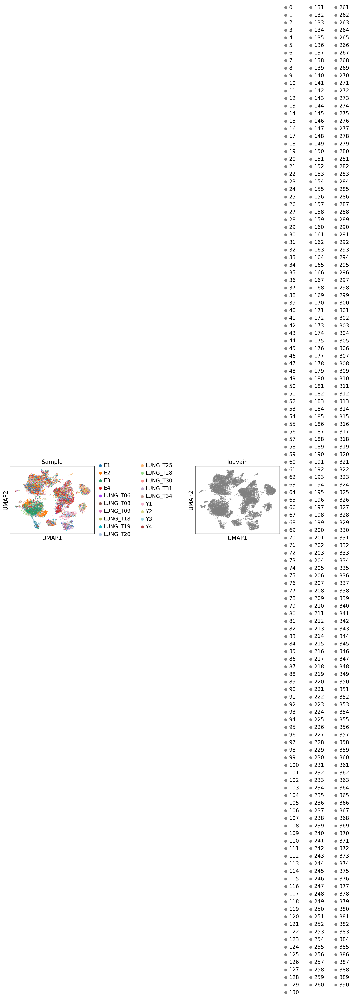

In [50]:
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata)
sc.tl.louvain(adata,resolution=20)
sc.pl.umap(adata, color=['Sample','louvain'],wspace=1,save='_n_neighbors_05.pdf')

In [73]:
save_file = 'output2_step2.5.3.filter_junk_scanpy_pipeline/data/adata.harmony.overclustered.h5ad'
adata.write_h5ad(save_file)

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [51]:
#import scanpy.api as sc
#import matplotlib.pyplot as plt
#import seaborn as sns

def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig


In [55]:
cluster_props= get_cluster_proportions(adata, cluster_key='scrublet_predict_default', sample_key= 'louvain')
plot_cluster_proportions(cluster_props)

In [63]:
cluster_props

scrublet_predict_default,False,True
louvain,,
0,100.000000,0.000000
1,100.000000,0.000000
2,99.796334,0.203666
3,100.000000,0.000000
4,99.569892,0.430108
...,...,...
386,100.000000,0.000000
387,56.250000,43.750000
388,100.000000,0.000000


In [61]:
cluster_props.to_csv('output2_step2.5.3.filter_junk_scanpy_pipeline/data/proportion.doublet.vs.overcluster.csv')

In [60]:
# variables
labels = ['False','True']
colors = ['#1D2F6F', '#8390FA']
title = 'proportion of Doublet in each cluster'
subtitle = 'Proportion'
def plot_stackedbar_p(df, labels, colors, title ,subtitle):
    fields = df.columns.tolist()
    
    # figure and axis
    fig, ax = plt.subplots(1, figsize=(20, 100))
# plot bars
    left = len(df) * [0]
    for idx, name in enumerate(fields):
        plt.barh(df.index, df[name], left = left, color=colors[idx])
        left = left + df[name]
# title and subtitle
    plt.title(title, loc='left')
    plt.text(0, ax.get_yticks()[-1] + 0.75, subtitle)
# legend
    plt.legend(labels, bbox_to_anchor=([0.58, 1, 0, 0]), ncol=4, frameon=False)
# remove spines
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
# format x ticks
    xticks = np.arange(0,1.1,0.1)
    xlabels = ['{}%'.format(i) for i in np.arange(0,101,10)]
    plt.xticks(xticks, xlabels)
# adjust limits and draw grid lines
    plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
    ax.xaxis.grid(color='gray', linestyle='dashed')
plt.show()
    
plot_stackedbar_p(cluster_props, labels, colors, title, subtitle)

In [64]:
adata.obs.louvain.value_counts().to_csv('output2_step2.5.3.filter_junk_scanpy_pipeline/data/abs.counts.of.overcluster.csv')

In [66]:
marker_genes_dict = {
    'Epithelial': ['EPCAM', 'KRT19', 'CDH1', 'KRT18'],
    'Tcell': ['CD3D', 'CD3E', 'CD3G', 'TRAC'],
    'NK': ['NCAM1', 'NKG7', 'GNLY', 'KLRD1', 'KLRF1'],
    'Bcell': ['CD79A', 'IGHM', 'IGHG3', 'IGHA2'],
    'Myeloid': ['CD68', 'MARCO', 'FCGR3A', 'LYZ','AIF1'],
    'Mast': ['KIT', 'MS4A2','GATA2','TPSB2'],
    'Fibroblasts': ['DCN', 'COL1A1', 'COL1A2', 'THY1'],
    'Endothelial':['PECAM1', 'CLDN5', 'FLT1', 'RAMP2'],
    'Cycling':['STMN1', 'MKI67', 'TOP2A', 'CDK1']
}
#sc.tl.dendrogram(adata, groupby='louvain')
sc.pl.dotplot(adata, marker_genes_dict, groupby='louvain', dendrogram=True, 
              save='_overclusters.markers.pdf')

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


categories: 0, 1, 2, etc.
var_group_labels: Epithelial, Tcell, NK, etc.


In [67]:
badcluster=['69','80','97','106','111','123','149','164','200','201','220','246','262',
            '268','273','277','289','311','313','331','339','353','354','362','369','371',
            '372','374','377','380','381','383','385','386','387','388']

In [85]:
tmp=adata.copy()
tmp=tmp[-tmp.obs['louvain'].isin(badcluster)]

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [86]:
tmp

View of AnnData object with n_obs × n_vars = 58031 × 2903
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30', 'louvain'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'louvain', 'Sample_colors', 'louvain_colors', "dendrogram_['louvain']"
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [93]:
adata_sub=sc.AnnData(tmp.raw.X,obs=tmp.obs,var=tmp.raw.var)

In [94]:
adata_sub

AnnData object with n_obs × n_vars = 58031 × 20532
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30', 'louvain'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

In [95]:
adata_sub.var_names

Index(['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', 'A2M-AS1', 'A2ML1', 'A2ML1-AS1',
       'A2ML1-AS2', 'A4GALT', 'A4GNT',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B',
       'ZYX', 'ZZEF1'],
      dtype='object', length=20532)

In [96]:
#run again
adata_sub.raw = adata_sub
adata_sub.layers["counts"] = adata_sub.X.copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)
sc.pp.highly_variable_genes(adata_sub, min_mean=0.0125, max_mean=3, min_disp=0.5)

#
adata_sub= adata_sub[:, adata_sub.var.highly_variable]
sc.pp.regress_out(adata_sub, ['nCount_RNA', 'percent_mt_merge','CC_Difference'])
sc.pp.scale(adata_sub, max_value=10)
sc.tl.pca(adata_sub, svd_solver='arpack')

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [99]:
adata_sub

AnnData object with n_obs × n_vars = 58031 × 3723
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30', 'louvain'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [100]:
sce.pp.harmony_integrate(adata_sub, 'Sample')

2021-04-01 15:20:09,779 - harmonypy - INFO - Iteration 1 of 10
2021-04-01 15:20:35,370 - harmonypy - INFO - Iteration 2 of 10
2021-04-01 15:21:00,537 - harmonypy - INFO - Iteration 3 of 10
2021-04-01 15:21:25,768 - harmonypy - INFO - Iteration 4 of 10
2021-04-01 15:21:51,857 - harmonypy - INFO - Iteration 5 of 10
2021-04-01 15:22:17,702 - harmonypy - INFO - Converged after 5 iterations


In [101]:
adata_sub

AnnData object with n_obs × n_vars = 58031 × 3723
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30', 'louvain'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts'

In [172]:
sc.pp.neighbors(adata_sub, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_sub)


In [179]:
sc.tl.louvain(adata_sub,resolution=1.5)

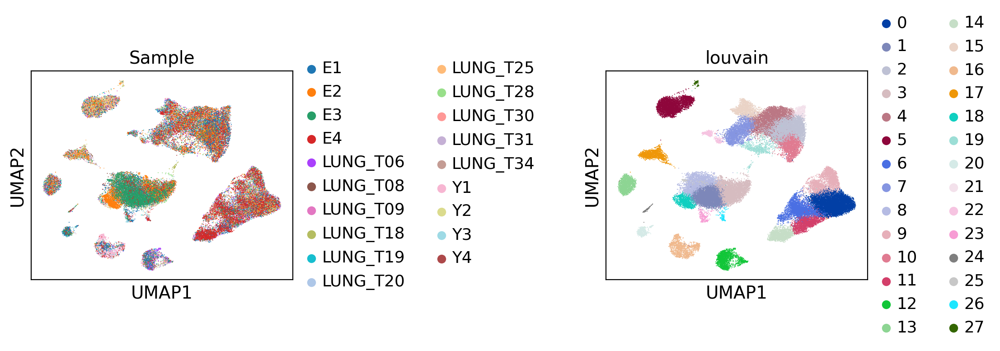

In [186]:
sc.pl.umap(adata_sub, color=['Sample','louvain'],wspace=1,save='_DoublectFiltered_n_neighbors_15_res_1.5_batch.pdf')

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


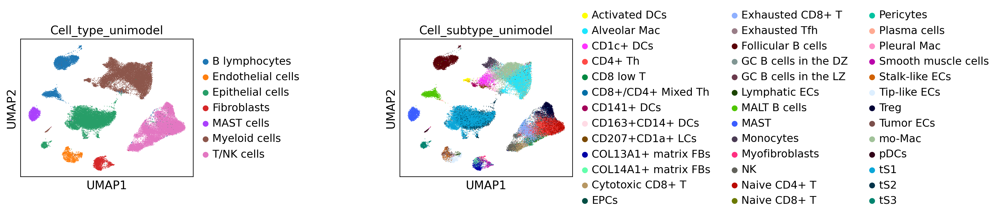

In [187]:
sc.pl.umap(adata_sub, color=['Cell_type_unimodel','Cell_subtype_unimodel'],wspace=1,
           save='_DoublectFiltered_n_neighbors_15_res_1.5_unimodel_celltype.pdf')

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


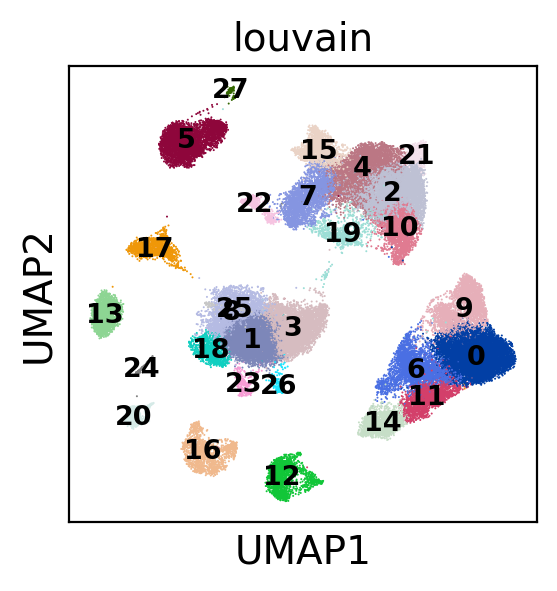

In [188]:
sc.pl.umap(adata_sub, color=['louvain'],legend_loc='on data',legend_fontsize='x-small',
           save='_DoublectFiltered_n_neighbors_15_res_1.5_louvain.pdf')

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


categories: 0, 1, 2, etc.
var_group_labels: Epithelial, Tcell, NK, etc.


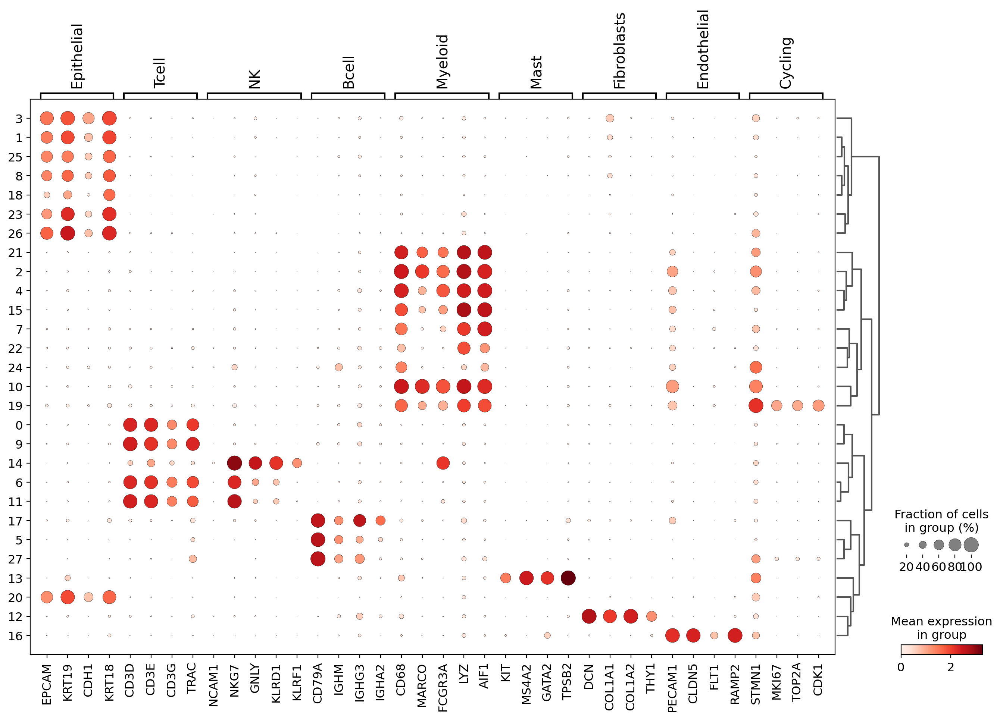

In [189]:
sc.tl.dendrogram(adata_sub, groupby='louvain')
sc.pl.dotplot(adata_sub, marker_genes_dict, groupby='louvain', dendrogram=True, 
              save='_DoublectFiltered_overclusters.markers.pdf')

In [190]:
marker_genes = ['EPCAM','CD3D','CD79A','NKG7','CD68','KIT','DCN','RAMP2','MKI67'
                 ]

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


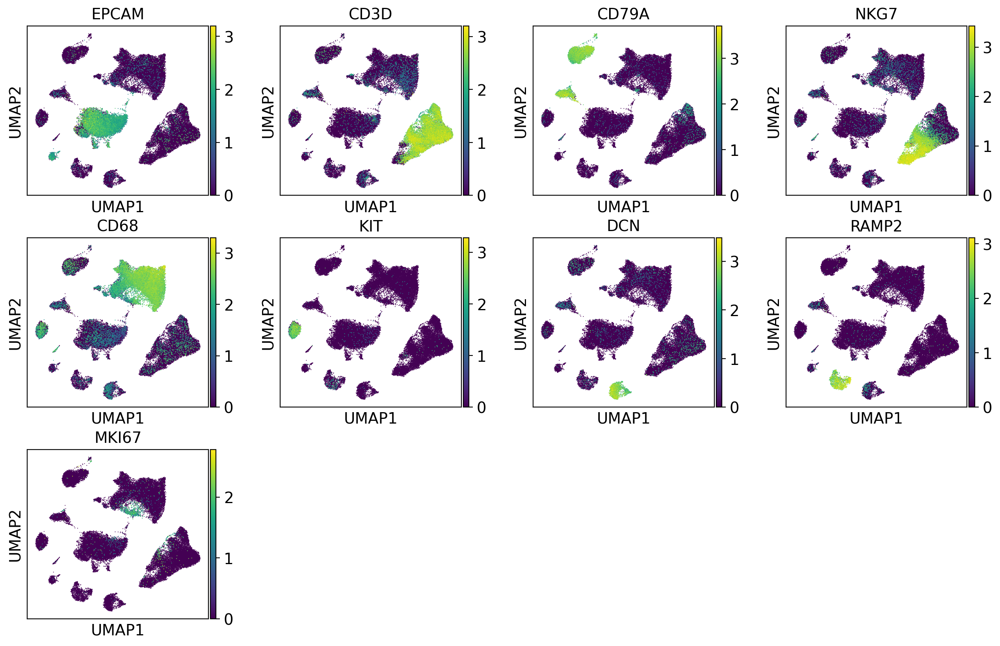

In [192]:
sc.pl.umap(adata_sub, color=marker_genes, save='_marker_individuals.mainlineage.pdf')

In [193]:
adata_sub.obs['louvain_cluster']=adata_sub.obs.louvain 

In [199]:
#####rename the clusters
cluster_dict={'0':'T cells','1':'Epithelial', '2':'Myeloid cells', '3':'Epithelial', '4':'Myeloid cells', 
              '5':'B cells', '6':'T cells' ,'7':'Myeloid cells','8':'Epithelial', '9':'T cells', '10':'Myeloid cells',
              '11':'T cells', '12':'Fibroblasts', '13':'Mast cells', '14':'NK cells', '15':'Myeloid cells', 
              '16':'Endothelial','17':'B cells', '18':'Epithelial', '19':'Myeloid cells', '20':'Epithelial',
              '21':'Myeloid cells', '22':'Myeloid cells', '23':'Epithelial', '24':'Myeloid cells', '25':'Epithelial',
              '26':'Epithelial', '27':'B cells'}
#####
adata_sub.obs['Defined_Cell_Type'] = (
    adata_sub.obs["louvain_cluster"]
    .map(lambda x: cluster_dict.get(x, x))
    .astype("category")
)

In [200]:
pd.crosstab(adata_sub.obs.louvain_cluster, adata_sub.obs.Defined_Cell_Type)

Defined_Cell_Type,B cells,Endothelial,Epithelial,Fibroblasts,Mast cells,Myeloid cells,NK cells,T cells
louvain_cluster,,,,,,,,
0,0,0,0,0,0,0,0,7058
1,0,0,5546,0,0,0,0,0
2,0,0,0,0,0,5166,0,0
3,0,0,4302,0,0,0,0,0
4,0,0,0,0,0,4017,0,0
5,3666,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,3288
7,0,0,0,0,0,2602,0,0
8,0,0,2533,0,0,0,0,0


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


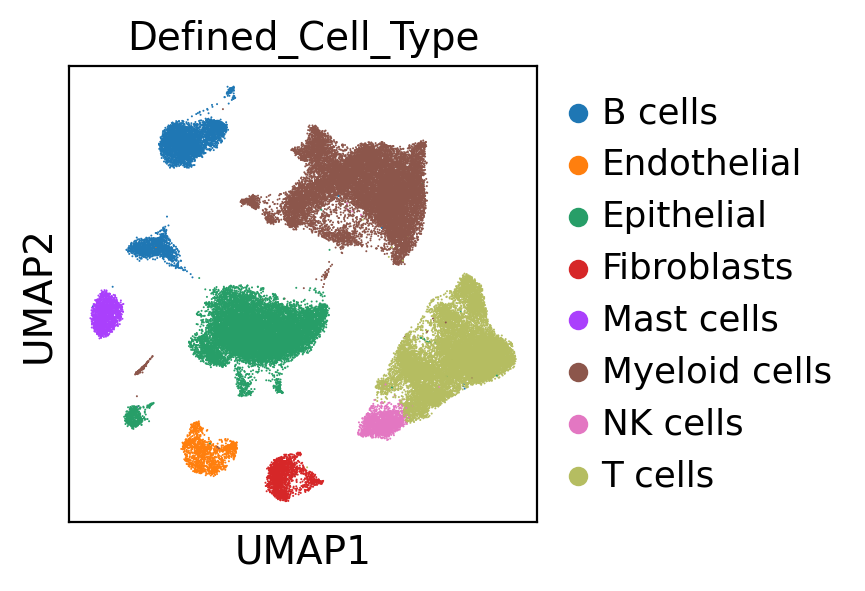

In [201]:
sc.pl.umap(adata_sub, color=['Defined_Cell_Type'],#wspace=1,
           save='_DoublectFiltered_n_neighbors_15_res_1.5_Defined_Cell_Type.pdf')

In [202]:
save_file = 'output2_step2.5.3.filter_junk_scanpy_pipeline/data/adata.harmony.overclustered.filtered.CelltypeDefined.h5ad'
adata_sub.write_h5ad(save_file)

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


# subclustering
#

In [3]:
# SPECIFY OUTPUT STEMS FOR FIGURES/PATHWAY ANALYSIS
#FIG_output_stem = "./output_step2.5.3.filter_junk_scanpy_pipeline/" + now +'/'
FIG_output_stem = "./output2_step2.5.3.filter_junk_scanpy_pipeline/" + 'figure_Tcell' +'/'
DATA_output_stem = "./output2_step2.5.3.filter_junk_scanpy_pipeline/" + 'data_Tcell' +'/'

print(FIG_output_stem)
print(DATA_output_stem)

# CREATE FIGURE DIRECTORY IF IT DOES NOT EXIST     
d = os.path.dirname(FIG_output_stem)
if not os.path.exists(d):
        os.makedirs(d)

d = os.path.dirname(DATA_output_stem)
if not os.path.exists(d):
        os.makedirs(d)
#
sc.settings.figdir=FIG_output_stem

./output2_step2.5.3.filter_junk_scanpy_pipeline/figure_Tcell/
./output2_step2.5.3.filter_junk_scanpy_pipeline/data_Tcell/


In [6]:
adata=sc.read('output2_step2.5.3.filter_junk_scanpy_pipeline/data/adata.harmony.overclustered.filtered.CelltypeDefined.h5ad')
adata

Only considering the two last: ['.CelltypeDefined', '.h5ad'].
Only considering the two last: ['.CelltypeDefined', '.h5ad'].


AnnData object with n_obs × n_vars = 58031 × 3723
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30', 'louvain', 'louvain_cluster', 'Defined_Cell_Type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cell_subtype_unimodel_colors', 'Cell_type_unimodel_colors', 'Defined_Cell_Type_colors', 'Sample_colors', "dendrogram_['louvain']", 'hvg', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_u

In [7]:
adata_Tcell=adata[adata.obs['Defined_Cell_Type'].isin(['T cells','NK cells'])]
sc.tl.pca(adata_Tcell, svd_solver='arpack')
#sce.pp.harmony_integrate(adata_Tcell, 'Sample')
#sc.pp.neighbors(adata_Tcell, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.pp.neighbors(adata_Tcell, n_neighbors=20, n_pcs=50,use_rep='X_pca_harmony')
sc.tl.umap(adata_Tcell)


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [8]:
sc.tl.louvain(adata_Tcell, resolution=1, key_added='Defined_Cell_Subtype_cluster')


In [9]:
save_file = 'output2_step2.5.3.filter_junk_scanpy_pipeline/data_Tcell/adata_Tcell.h5ad'
adata_Tcell.write_h5ad(save_file)

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


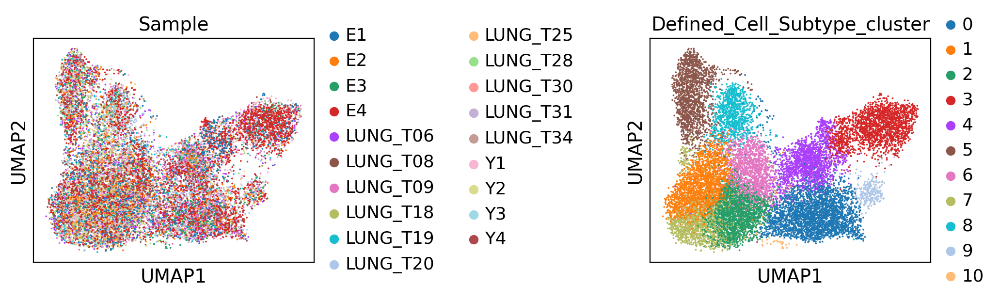

In [9]:
sc.pl.umap(adata_Tcell, color=['Sample','Defined_Cell_Subtype_cluster'],wspace=1,save='_Tcell.pdf')

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


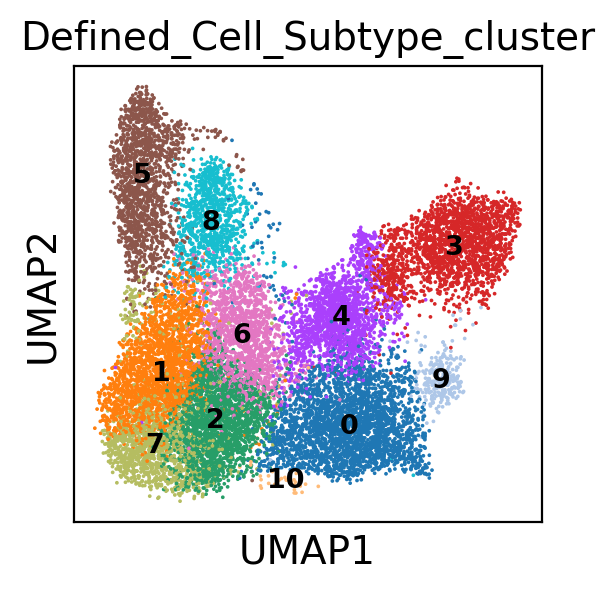

In [10]:
sc.pl.umap(adata_Tcell, color=['Defined_Cell_Subtype_cluster'],legend_loc='on data',legend_fontsize='x-small',save='_Tcell_cluster.pdf' )


In [11]:
adata_Tcell

AnnData object with n_obs × n_vars = 16530 × 3723
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'Index', 'Sample', 'percent_mt', 'percent_rb', 'Cell_type', 'Cell_type_refined', 'Cell_subtype', 'age', 'Sex', 'Smoking', 'Stages', 'percent_mt_merge', 'percent_rb_merge', 'S_Score', 'G2M_Score', 'Phase', 'old_ident', 'CC_Difference', 'Cell_subtype_unimodel', 'Cell_type_unimodel', 'UMAP_Clusters_harmony_overclustered', 'scrubletScore_default', 'scrublet_predict_default', 'scrubletScore_n30', 'scrublet_predict_n30', 'louvain', 'louvain_cluster', 'Defined_Cell_Type', 'Defined_Cell_Subtype_cluster'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cell_subtype_unimodel_colors', 'Cell_type_unimodel_colors', 'Defined_Cell_Type_colors', 'Sample_colors', "dendrogram_['louvain']", 'hvg', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'Define

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


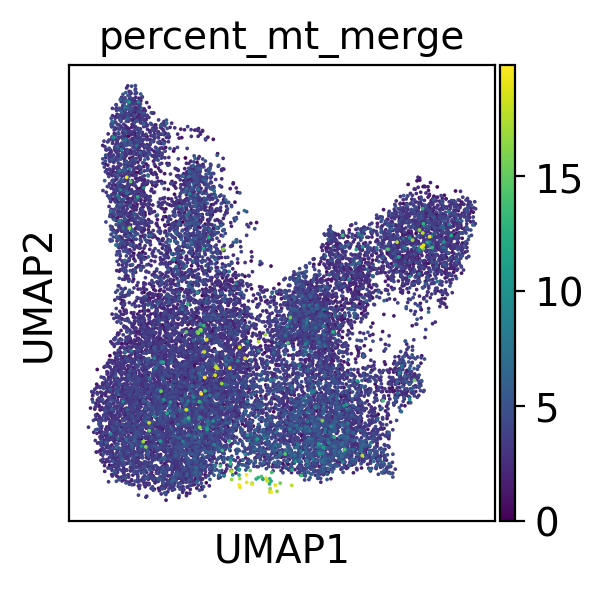

In [12]:
sc.pl.umap(adata_Tcell, color=['percent_mt_merge'], save='_MTpercentage.pdf')

In [13]:
marker_genes_dict = {
    'Tcell': ['CD3D', 'CD3E', 'CD3G'],
    'NK': ['NCAM1', 'NKG7', 'GNLY', 'KLRD1','FCGR3A','FGFBP2','TYROBP','XCL1','XCL2','FCER1G'],
    'CD4-Tcell':['IL7R','CD4'],
    'CD8-Tcell':['CD8A','CD8B'],
    'CD4-T-Eff-Memory':['ZNF683','CD69','ANXA1','S100A4','CCR6','LTB','GPR183','CD40LG','CXCR3','CXCR6'],
    'Naive': ['TCF7','SELL','LEF1','CCR7'],
    'Exhuasted':['IFI6','LAG3','TIGIT','PDCD1','HAVCR2','CTLA4','BTLA'],
    'Cytotoxic': ['IL2','GZMA','PRF1','GZMB','GZMK','IFNG','GZMH'],
    'Treg':['IL2RA','FOXP3','IKZF2'],
    #'Tfh':['FTH1','MAF','CXCR5','CXCL13'],
    #'Th17':['IRF4','CREM','NR4A2'],
    #'Th1':['STAT4','IL12RB2'],
    #'Th2': ['GATA3','STAT6','IL4'],
    #'gamma delta T':['TRDC','TRGC2','TRGC1'],
    'Proliferation':['STMN1', 'MKI67', 'TOP2A', 'CDK1']
}


In [14]:
#adata_Tcell.raw.var.to_csv('output2_step2.5.3.filter_junk_scanpy_pipeline/data_Tcell/gene.list.csv')

categories: 0, 1, 2, etc.
var_group_labels: Tcell, NK, CD4-Tcell, etc.


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


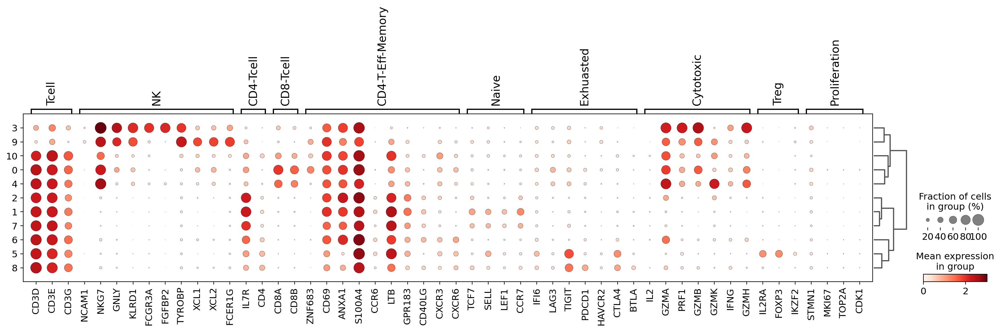

In [15]:
sc.tl.dendrogram(adata_Tcell, groupby='Defined_Cell_Subtype_cluster')
sc.pl.dotplot(adata_Tcell, marker_genes_dict, groupby='Defined_Cell_Subtype_cluster',
              dendrogram=True, use_raw=True,#standard_scale='var',
              #,dot_max=0.5,dot_min=0.2,
              save='_Tcell.markers.pdf')

categories: 0, 1, 2, etc.
var_group_labels: Tcell, NK, CD4-Tcell, etc.


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


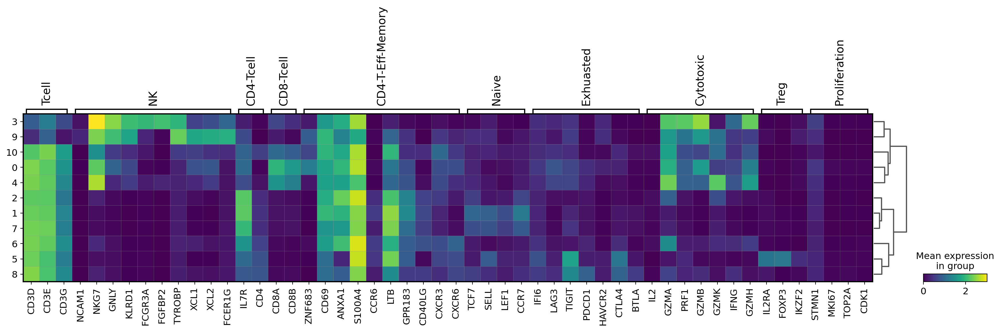

In [16]:

gs = sc.pl.matrixplot(adata_Tcell, marker_genes_dict, groupby='Defined_Cell_Subtype_cluster',
                      dendrogram=True, #standard_scale='var',
                      save='_Tcell.markers.pdf')

In [17]:
#find markers
sc.tl.rank_genes_groups(adata_Tcell, 'Defined_Cell_Subtype_cluster', method='wilcoxon')
#sc.pl.rank_genes_groups(adata_Tcell, n_genes=25, sharey=False)

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [18]:
result = adata_Tcell.uns['rank_genes_groups']
groups = result['names'].dtype.names


In [19]:
res=pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','pvals_adj','logfoldchanges']})
res.to_csv('output2_step2.5.3.filter_junk_scanpy_pipeline/data_Tcell/degs_Tcell_cluster.csv')

In [20]:
####define sub clusters
####
#####rename the clusters
cluster_dict={'0':'CD8 Tcells-C1-ZNF683','1':'CD4 Tcells-C1-CCR7', '2':'CD4 Tcells-C2-GPR183',
              '3':'NK cells-C1-FCGR3A', '4':'CD8 Tcells-C2-GZMK', 
              '5':'CD4 Tcells-C3-FOXP3', '6':'CD4 Tcells-C4-GZMA' ,'7':'CD4 Tcells-C5-LEF1',
              '8':'CD4 Tcells-C6-TIGIT', '9':'NK cells-C2-XCL1', '10':'MT_prodominant'}
#####
adata_Tcell.obs['Defined_Cell_Subtype_rename'] = (
    adata_Tcell.obs["Defined_Cell_Subtype_cluster"]
    .map(lambda x: cluster_dict.get(x, x))
    .astype("category")
)

cluster_dict={'0':'CD8 Tcells Effector memory','1':'CD4 Tcells Naive', '2':'CD4 Tcells Effector memory',
              '3':'NK cells CD16+', '4':'CD8 Tcells Cytotoxic', 
              '5':'Tregs', '6':'CD4 Tcells Cytotoxic' ,'7':'CD4 Tcells Naive',
              '8':'CD4 Tcells Exhuasted', '9':'NK cells CD16-', '10':'MT_prodominant'}
#####
adata_Tcell.obs['Defined_Cell_Subtype_function'] = (
    adata_Tcell.obs["Defined_Cell_Subtype_cluster"]
    .map(lambda x: cluster_dict.get(x, x))
    .astype("category")
)




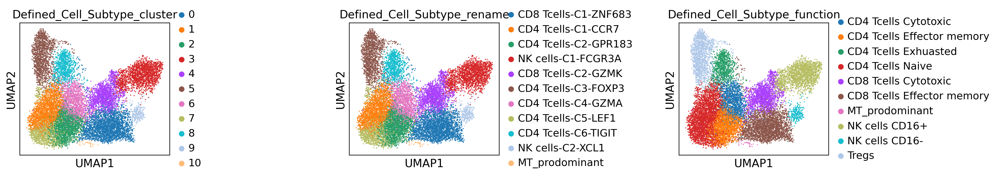

In [21]:
sc.pl.umap(adata_Tcell, color=['Defined_Cell_Subtype_cluster', 
                              'Defined_Cell_Subtype_rename',
                              'Defined_Cell_Subtype_function'],wspace=1,save='_Tcell_cluster_defined.pdf')

In [22]:
save_file = 'output2_step2.5.3.filter_junk_scanpy_pipeline/data_Tcell/adata_Tcell_clusteredDefined.h5ad'
adata_Tcell.write_h5ad(save_file)

/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


# subclustering Tcell CD8

In [ ]:
# SPECIFY OUTPUT STEMS FOR FIGURES/PATHWAY ANALYSIS
#FIG_output_stem = "./output_step2.5.3.filter_junk_scanpy_pipeline/" + now +'/'
FIG_output_stem = "./output2_step2.5.3.filter_junk_scanpy_pipeline/" + 'figure_Tcell' +'/'
DATA_output_stem = "./output2_step2.5.3.filter_junk_scanpy_pipeline/" + 'data_Tcell' +'/'

print(FIG_output_stem)
print(DATA_output_stem)

# CREATE FIGURE DIRECTORY IF IT DOES NOT EXIST     
d = os.path.dirname(FIG_output_stem)
if not os.path.exists(d):
        os.makedirs(d)

d = os.path.dirname(DATA_output_stem)
if not os.path.exists(d):
        os.makedirs(d)
#
sc.settings.figdir=FIG_output_stem

In [ ]:
adata_Tcell=adata[adata.obs['Defined_Cell_Type'].isin(['T cells','NK cells'])]
sc.tl.pca(adata_Tcell, svd_solver='arpack')
#sce.pp.harmony_integrate(adata_Tcell, 'Sample')
#sc.pp.neighbors(adata_Tcell, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.pp.neighbors(adata_Tcell, n_neighbors=20, n_pcs=50,use_rep='X_pca_harmony')
sc.tl.umap(adata_Tcell)



In [55]:
tmp=adata.copy()
tmp=tmp[tmp.obs['Defined_Cell_Type'].isin(['T cells','NK cells'])]
adata_sub=sc.AnnData(tmp.raw.X,obs=tmp.obs,var=tmp.raw.var)
#run again
adata_sub.raw = adata_sub
adata_sub.layers["counts"] = adata_sub.X.copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)
sc.pp.highly_variable_genes(adata_sub, min_mean=0.0125, max_mean=3, min_disp=0.5)

#
adata_sub= adata_sub[:, adata_sub.var.highly_variable]
sc.pp.regress_out(adata_sub, ['nCount_RNA', 'percent_mt_merge','CC_Difference'])
sc.pp.scale(adata_sub, max_value=10)
sc.tl.pca(adata_sub, svd_solver='arpack')


sce.pp.harmony_integrate(adata_sub, 'Sample')





/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2021-04-02 13:51:21,472 - harmonypy - INFO - Iteration 1 of 10
2021-04-02 13:51:28,328 - harmonypy - INFO - Iteration 2 of 10
2021-04-02 13:51:35,152 - harmonypy - INFO - Iteration 3 of 10
2021-04-02 13:51:41,596 - harmonypy - INFO - Converged after 3 iterations


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


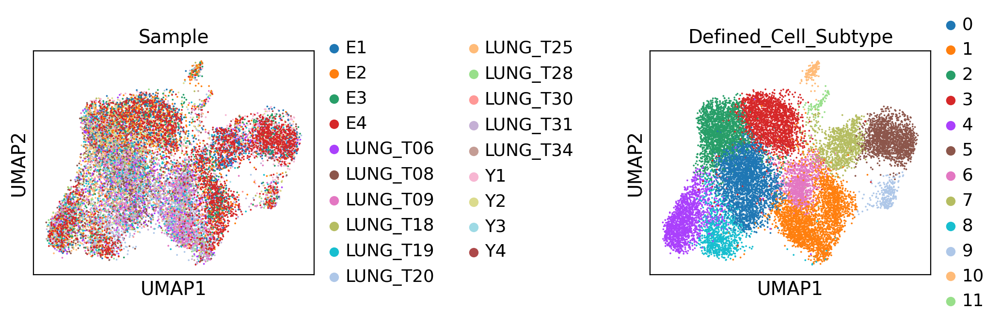

In [66]:
sc.pp.neighbors(adata_sub, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_sub)
sc.tl.louvain(adata_sub, resolution=1, key_added='Defined_Cell_Subtype')
sc.pl.umap(adata_sub, color=['Sample','Defined_Cell_Subtype'],wspace=1)

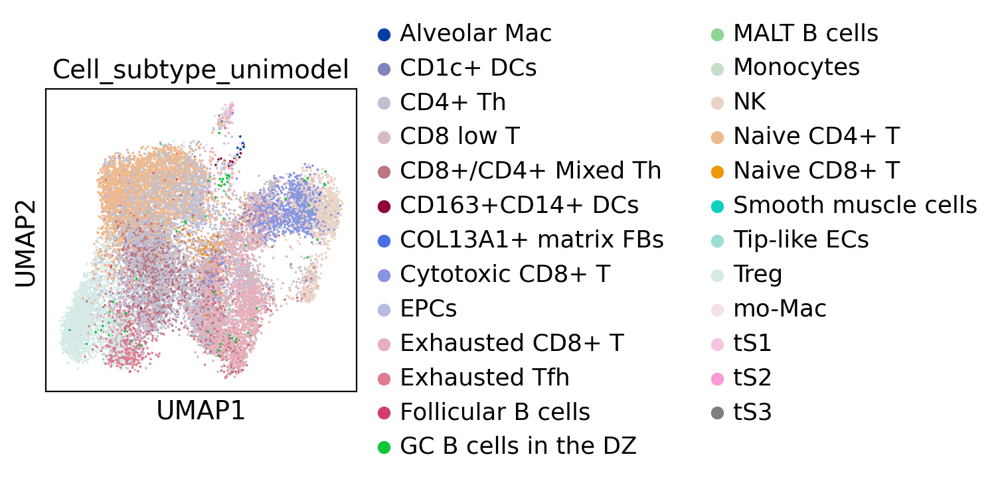

In [100]:
sc.pl.umap(adata_sub, color=['Cell_subtype_unimodel'])

categories: 0, 1, 2, etc.
var_group_labels: Tcell, NK, CD4-Tcell, etc.


/home/chenh/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


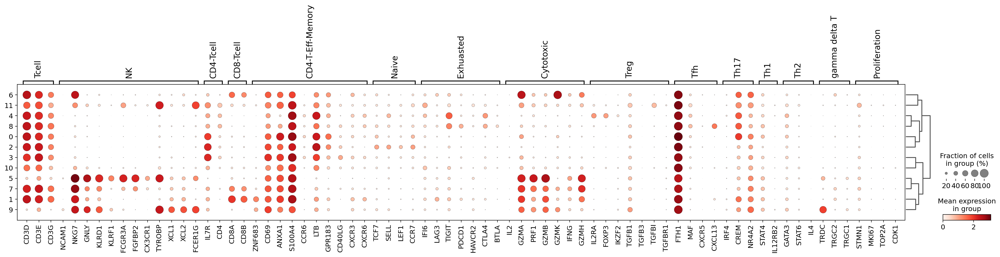

In [116]:
sc.tl.dendrogram(adata_sub, groupby='Defined_Cell_Subtype')
sc.pl.dotplot(adata_sub, marker_genes_dict, groupby='Defined_Cell_Subtype', dendrogram=True)